<center>
<h1> Quantum Computing<br>
an introduction without the physics </h1>
Luciano Bello<br>
bel@zurich.ibm.com<br>
twitter: @microluciano
</center>

In [1]:
%%html
<style>
.container { width:100% !important;
</style>
            

<img src="vacuum_tube.png" />

# Universal model of quantum computation

We could implement any classical computation, but not every algorithm can be implemented in a quantum computer efficiently (taking advantage of quantum features).

Example of things that a quantum computer can do "faster":

* Simulating quantum systems
* Factor numbers in  polynomial time (Shor's algorithm 1994)
     * Quantum Fourier transform 
* Optimization problems (for example, for ML)
     * Quadratic speedup search in an unsorted list (Grover's algorithm 1996)
     *  Solving linear systems (Quantum algorithm for linear systems of equations, HHL 2009)


# Gates, gates, gates
<img src="classical_circuit.png" />
<small style="font-size:0.3;">from A Gentle Introduction to the Art of Mathematics
 https://people.math.carleton.ca/~kcheung/math/books/giam-ON/html/sec-pred.html</small>
 
<img src="IQX.png" />
<small style="font-size:0.3;">from https://quantum-computing.ibm.com/composer/</small>

## Qubits

Zero and One
$$
|0\rangle = \begin{bmatrix} 1 \\ 0 \end{bmatrix} \, \, \, \, |1\rangle =\begin{bmatrix} 0 \\ 1 \end{bmatrix}
$$

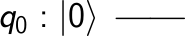

In [2]:
from qiskit import QuantumCircuit

circuit = QuantumCircuit(1)
circuit.draw('latex', initial_state=True)

In [3]:
import kaleidoscope.qiskit
from kaleidoscope import bloch_sphere
from qiskit.visualization import array_to_latex
from IPython.display import Latex

display(array_to_latex(circuit.statevector()))
bloch_sphere(circuit.statevector())

<IPython.core.display.Latex object>

# Gates are matrices, applying gates is matrix multiplaction

Appling NOT Gate:


$$ X|0\rangle = \begin{bmatrix} 0 & 1 \\ 1 & 0 \end{bmatrix}\begin{bmatrix} 1 \\ 0 \end{bmatrix} = \begin{bmatrix} 0 \\ 1 \end{bmatrix} = |1\rangle$$


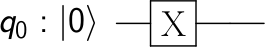

In [4]:
circuit = QuantumCircuit(1)
circuit.x(0)
circuit.draw('latex', initial_state=True)

In [5]:
display(array_to_latex(circuit.statevector(), prefix="|1\\rangle = "))
bloch_sphere(circuit.statevector())

<IPython.core.display.Latex object>

<img src="X_Bloch.gif" />

# Superposition 

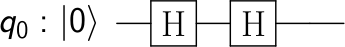

In [6]:
circuit = QuantumCircuit(1)
circuit.h(0)
circuit.h(0)

circuit.draw('latex', initial_state=True)

In [7]:
display(array_to_latex(circuit.statevector(), prefix="|+\\rangle = "))
bloch_sphere(circuit.statevector())

<IPython.core.display.Latex object>

<img src="H_Bloch.gif" />

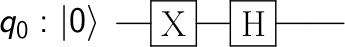

In [8]:
circuit = QuantumCircuit(1)
circuit.x(0)
circuit.h(0)
circuit.draw('latex', initial_state=True)

In [9]:
display(array_to_latex(circuit.statevector(), prefix="|-\\rangle = "))
bloch_sphere(circuit.statevector())

<IPython.core.display.Latex object>

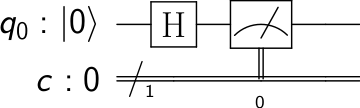

In [10]:
circuit = QuantumCircuit(1, 1)
circuit.h(0)
circuit.measure(0, 0)
circuit.draw('latex', initial_state=True)

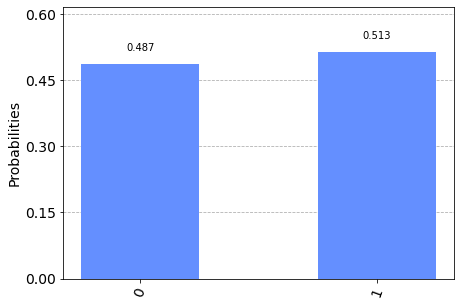

In [11]:
from qiskit import BasicAer, execute
from qiskit.visualization import plot_histogram

local_simulator = BasicAer.get_backend('qasm_simulator')

job = execute(circuit, backend=local_simulator, shots=1000)
plot_histogram(job.result().get_counts())

In [12]:
from qiskit.circuit.library import *
hgate = HGate()
print('H (1q gate)')
array_to_latex(hgate.to_matrix())

H (1q gate)


<IPython.core.display.Latex object>

# multi-qubit gates

<img src="classical_gates.png" />
from Wikipedia https://en.wikipedia.org/wiki/File:Cnot-compared-to-xor.svg

In [13]:
print('CX (2q gate)')
cxgate = CXGate()
array_to_latex(cxgate.to_matrix())

CX (2q gate)


<IPython.core.display.Latex object>

In [14]:
print('CCX (3q gate)')
ccxgate = CCXGate()
array_to_latex(ccxgate.to_matrix())

CCX (3q gate)


<IPython.core.display.Latex object>

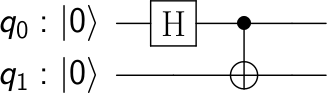

In [15]:
circuit = QuantumCircuit(2)
circuit.h(0)
circuit.cx(0, 1)
circuit.draw('latex', initial_state=True)

In [16]:
array_to_latex(circuit.statevector(), prefix="\\text{CNOT}|0{+}\\rangle = ")

<IPython.core.display.Latex object>

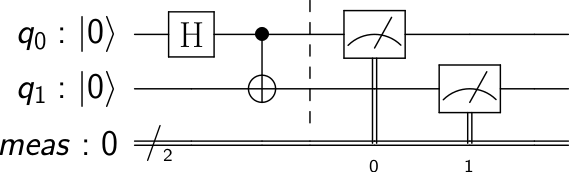

In [17]:
circuit.measure_all()
circuit.draw('latex', initial_state=True)

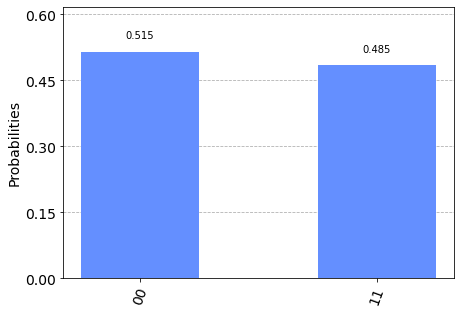

In [18]:
local_simulator = BasicAer.get_backend('qasm_simulator')

job = execute(circuit, backend=local_simulator, shots=1000)
plot_histogram(job.result().get_counts())

# Deutsch Algorithm

<table>
<tbody>
<tr>
<td colspan="2"><img src="deutsch_problem.png" /></td>
</tr>
<tr>
<td><img src="classic_oracle.png" /></td>
<td><img src="quantum_oracle.png" /></td>
</tr>
</tbody>
</table>

## Oracle 4: Constant zero

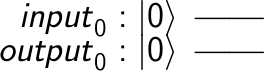

In [19]:
from qiskit import QuantumRegister

input = QuantumRegister(1, name='input')
output = QuantumRegister(1, name='output')
constant0 = QuantumCircuit(input, output, name='oracle')
oracle4 = constant0.to_instruction()
constant0.draw('latex', initial_state=True)

## Oracle 3: Constant one

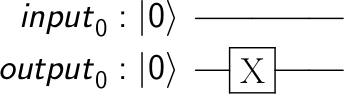

In [20]:
input = QuantumRegister(1, name='input')
output = QuantumRegister(1, name='output')
constant1 = QuantumCircuit(input, output, name='oracle')
constant1.x(output)
oracle3 = constant1.to_instruction()
constant1.draw('latex', initial_state=True)

## Oracle 1: Identity

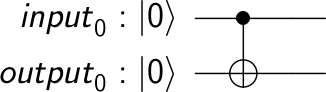

In [21]:
input = QuantumRegister(1, name='input')
output = QuantumRegister(1, name='output')
identity = QuantumCircuit(input, output, name='oracle')
identity.cx(input, output)
oracle1 = identity.to_instruction()
identity.draw('latex', initial_state=True)

## Oracle 2: Invert

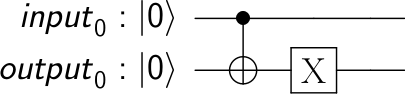

In [22]:
input = QuantumRegister(1, name='input')
output = QuantumRegister(1, name='output')
invert = QuantumCircuit(input, output, name='oracle')
invert.cx(input, output)
invert.x(output)
oracle2 = identity.to_instruction()
invert.draw('latex', initial_state=True)

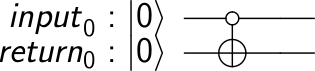

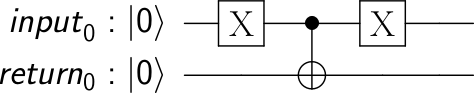

In [23]:
# footnote on alternative ways to write classical functions as quantum circuits

from qiskit.circuit import classical_function
from qiskit.circuit import Int1

@classical_function
def alt_invert(input: Int1) -> Int1:
    return not input

invert_gate = alt_invert.synth(registerless=False)
display(invert_gate.draw('latex', initial_state=True))
invert_gate.decompose().draw('latex', initial_state=True)

## Run an oracle

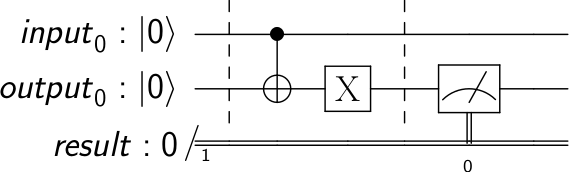

In [24]:
from qiskit import ClassicalRegister

result = ClassicalRegister(1, name='result')
circuit = QuantumCircuit(input, output, result)
# circuit.x(input) # <- set input to 1
circuit.barrier()
circuit.compose(invert, inplace=True) 
circuit.barrier()
circuit.measure(output, result)
circuit.draw('latex', initial_state=True)

In [25]:
execute(circuit, backend=local_simulator, shots=1000).result().get_counts()

{'1': 1000}

## Running Deutsch's Algorithm

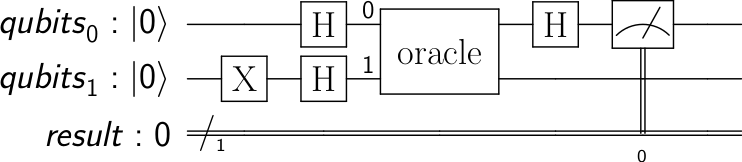

In [26]:
qr = QuantumRegister(2, name='qubits')
cr = ClassicalRegister(1, name='result')
circuit = QuantumCircuit(qr, cr)
circuit.x(qr[1])
circuit.h(qr)
circuit.append(oracle4, [qr[0], qr[1]]) # <-- you can replace here for other oracles
circuit.h(qr[0])
circuit.measure(qr[0], cr[0])
circuit.draw('latex', initial_state=True, justify="right")

In [27]:
counts = execute(circuit, backend=local_simulator, shots=1).result().get_counts()
counts['BALANCED'] = counts.pop('1', None)
counts['CONSTANT'] = counts.pop('0', None)
counts

{'BALANCED': None, 'CONSTANT': 1}

# wait... WAT?! Why?!

The difference between balanced/constant is the existance of a $\text{CNOT}$ gate in the oracle.
In essence, the only thing that Deutsch does is **detecting that $\text{CNOT}$**.

How can you detect that CNOT? The oracle box is closed.

Thanks to a trick called *phase kickback*. If you understand phase kickback you
will be able to understand many other algorithms.

## Phase kickback

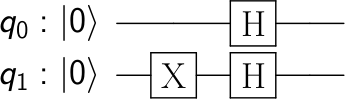

<IPython.core.display.Latex object>

In [28]:
circuit = QuantumCircuit(2)
circuit.h(0)
circuit.x(1)
circuit.h(1)

display(circuit.draw('latex', initial_state=True, justify='right'))
array_to_latex(circuit.statevector())

$$
\begin{gather*} 
q_1 & q_0 \\
|-\rangle & |+\rangle  \\
(|0\rangle - |1\rangle) & (|0\rangle + |1\rangle)
\end{gather*}\\
|00\rangle + |01\rangle - |10\rangle - |11\rangle
$$
(Qiskit's least significant bit has the lowest index)

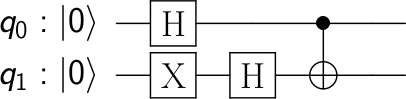

In [29]:
circuit.cx(0, 1) # <---
circuit.draw('latex', initial_state=True)

$$
\text{initial state} \\
|00\rangle + |01\rangle - |10\rangle - |11\rangle \\
\text{after the CNOT} \\
|00\rangle + |11\rangle - |10\rangle - |01\rangle \\
\text{reordering} \\
|00\rangle - |01\rangle - |10\rangle + |11\rangle \\
\text{factoring} \\
\begin{gather*} 
(|0\rangle - |1\rangle) & (|0\rangle - |1\rangle)\\
|-\rangle & |-\rangle  \\
q_1 & q_0 
\end{gather*}\\
$$

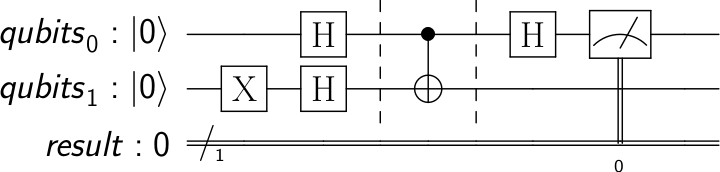

In [30]:
qr = QuantumRegister(2, name='qubits')
cr = ClassicalRegister(1, name='result')
circuit = QuantumCircuit(qr, cr)
circuit.x(qr[1])
circuit.h(qr)
circuit.barrier()
circuit.cx(qr[0], qr[1]) 
circuit.barrier()
circuit.h(qr[0])
circuit.measure(qr[0], cr[0]);
circuit.draw('latex', initial_state=True, justify="right")

Remember:
$$
|1\rangle \xrightarrow{\text{X}} |0\rangle ~~~~~~~~|0\rangle \xrightarrow{\text{H}} |+\rangle ~~~~~~~~|1\rangle \xrightarrow{\text{H}} |-\rangle 
$$
$$
|0\rangle \xrightarrow{\text{X}} |1\rangle ~~~~~~~~|+\rangle \xrightarrow{\text{H}} |0\rangle ~~~~~~~~ |-\rangle \xrightarrow{\text{H}} |1\rangle 
$$

# Real device!

In [31]:
import qiskit.tools.jupyter
from qiskit import IBMQ
from qiskit.providers.ibmq import least_busy

In [32]:
provider = IBMQ.load_account()
least_busy_device = least_busy(provider.backends(
    simulator=False,
    filters=lambda b: b.configuration().n_qubits >= 2))
least_busy_device

<IBMQBackend('ibmq_toronto') from IBMQ(hub='ibm-q-internal', group='deployed', project='default')>

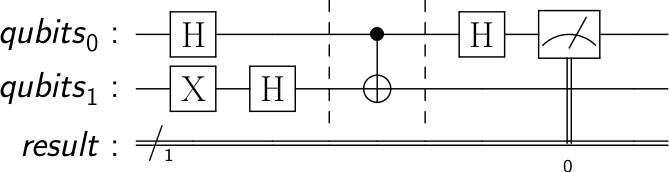

In [33]:
display(circuit.draw('latex'))
job = execute(circuit, backend=least_busy_device, shots=1000)

In [34]:
job.status()

<JobStatus.VALIDATING: 'job is being validated'>

In [35]:
job.wait_for_final_state()
job.status()

<JobStatus.DONE: 'job has successfully run'>

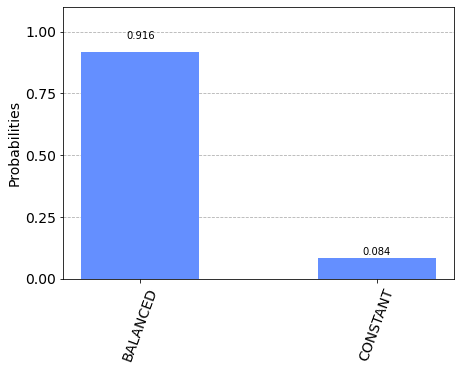

In [36]:
counts = job.result().get_counts()
counts['BALANCED'] = counts.pop('1', None)
counts['CONSTANT'] = counts.pop('0', None)  # wrong answer
plot_histogram(counts)

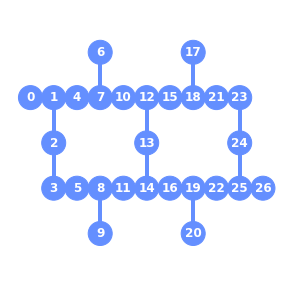

In [37]:
from qiskit.visualization import plot_gate_map
display(plot_gate_map(least_busy_device))
job = execute(circuit, backend=least_busy_device, shots=1000, initial_layout=[0, 4])

In [38]:
job.wait_for_final_state()
job.status()

<JobStatus.DONE: 'job has successfully run'>

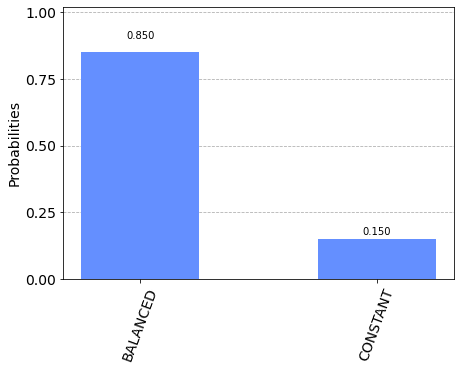

In [39]:
counts = job.result().get_counts()
counts['BALANCED'] = counts.pop('1', None)
counts['CONSTANT'] = counts.pop('0', None)  # wrong answer
plot_histogram(counts)

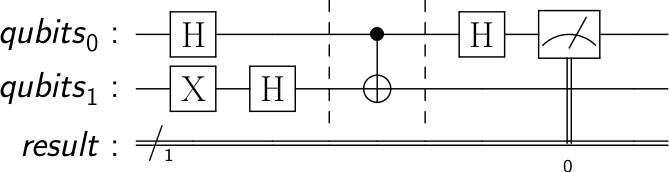

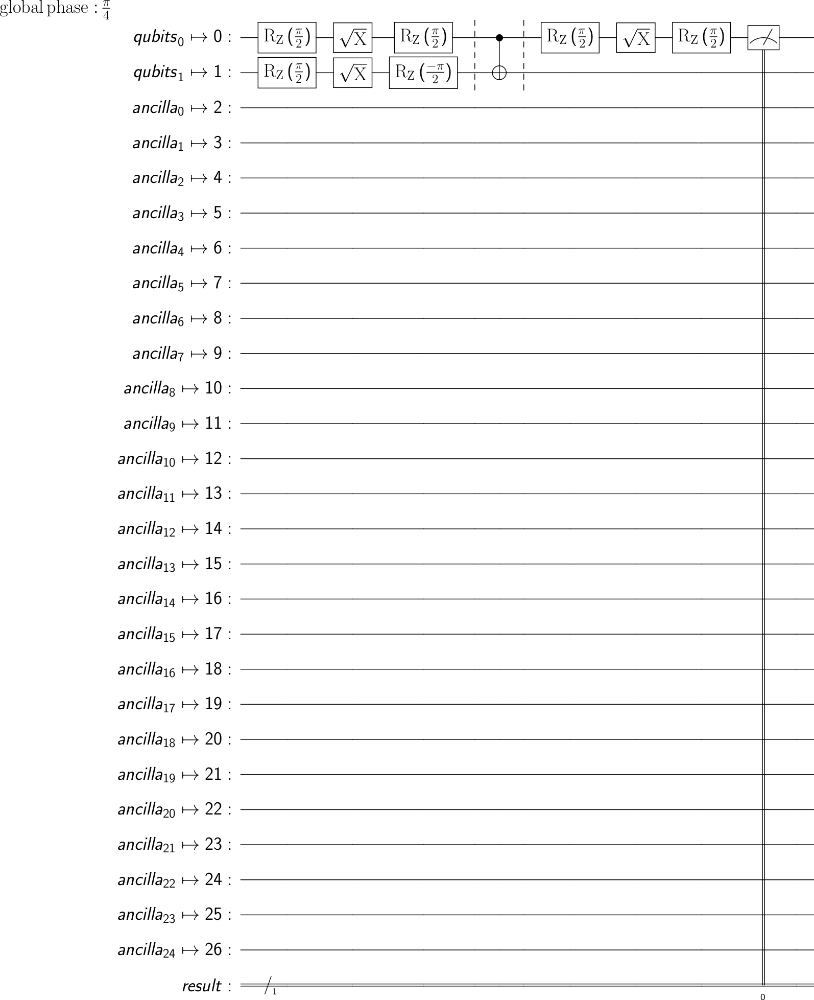

In [40]:
from qiskit import transpile

display(circuit.draw('latex'))
transpile(circuit, least_busy_device).draw('latex')

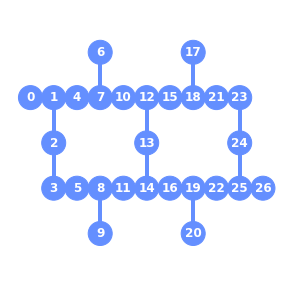

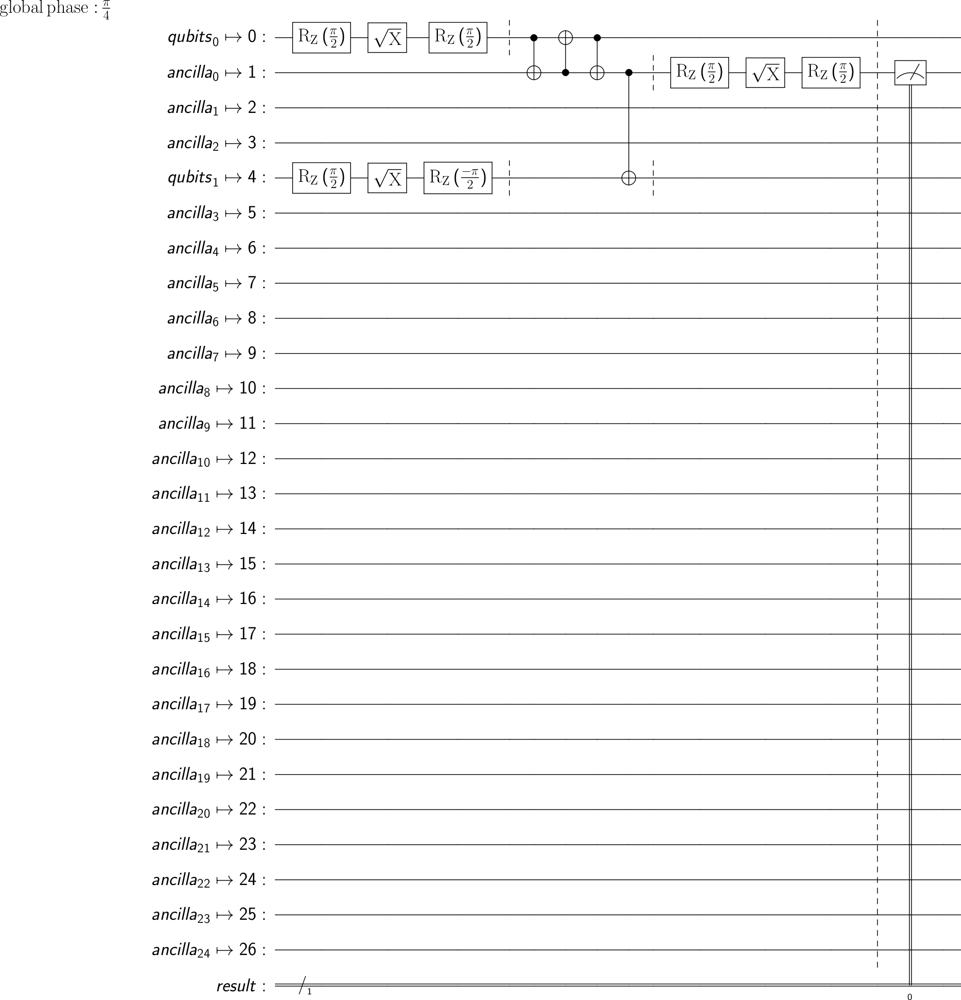

In [41]:
display(plot_gate_map(least_busy_device))
transpile(circuit, least_busy_device, initial_layout=[0, 4]).draw('latex')